# Exploratory Data Analysis for Time Series

In this notebook we will focus on studying the main time series components for each of the variables. The steps will be described below, but they will be repeated in each one of the variables. This analysis comes after the initial EDA done block by block, where we studied the different data fields and their distribution.

First of all, we will define some basic time series concepts (they are explained in natural language, for more information, refer to the complete thesis):
- **Stationarity**: a stationary time series is a time series where statistical properties do not change over time.
- **Time series decomposition**: when we consider a series as a combination of level, trend, seasonality and noise components, we can have an additive model or a multiplicative model.
- **Trend**: a trend component is the result of a varying mean over time.
- **Seasonality**: the seasonality component is a changing variance over time.
- **Differencing**: data transformation used to make a series stationary, it is performed by subtracting the previous observation from the current observation.
- **Lag difference**: the difference between consecutive observations is called a lag-1 difference.


## Imports

In [1]:
# Basic imports

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.filters.hp_filter import hpfilter
from scipy import signal

from scipy.stats import normaltest
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

import statsmodels.api as sm
import pymannkendall as mk

from pandas.plotting import autocorrelation_plot
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()
sns.set_style("darkgrid")
path = "../../data_postprocess/data_nuevo/"
path_bruto = "../../data/"

plt.rc("figure", figsize=(16, 12))
plt.rc("font", size=13)



In [2]:
def plot_detrends(df, var):

    fig, axes = plt.subplots(nrows=3,ncols=1, figsize=(10,10) )
    diff = df[var].diff()

    axes[0].plot(diff)
    axes[0].set_title('Detrending using Differencing', fontsize=12) 
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel(var)


    detrended = signal.detrend(df[var].values)
    axes[1].plot(detrended)
    axes[1].set_title('Detrending using Scipy Signal', fontsize=12) 
    axes[1].set_xlabel(var)
    axes[1].set_ylabel('Frequency')

    eu_cycle,eu_trend = hpfilter(df[var], lamb=100*(52*4*24*7)**2)
    detrended = df[var]-eu_trend
    axes[2].plot(detrended)
    axes[2].set_title('Detrending using HP Filter', fontsize=12) 
    axes[2].set_xlabel('Date')
    axes[2].set_ylabel(var)
    plt.suptitle('Detrending: '+ var, fontsize=16)
    plt.tight_layout()

In [3]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_seasonal_decompose(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    deseason = df[var] - result_mul.seasonal
    plt.figure(figsize=(15,6))
    plt.plot(deseason)
    plt.title('Deseasoning using seasonal_decompose (' +model+ ' model)', fontsize=12) 
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.show()


In [4]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)

In [5]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

def mostrar_descomp(df, variable, period):
    # Multiplicative Decomposition 
    multiplicative_decomposition = seasonal_decompose(df[variable], model='multiplicative', period = period)

    # Additive Decomposition
    additive_decomposition = seasonal_decompose(df[variable], model='add', period = period)

    # Plot
    plt.rcParams.update({'figure.figsize': (10,8)})

    multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    multiplicative_decomposition.plot().suptitle('Additive Decomposition with freq= ' +str(int(period/(4*24))) + " days", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    plt.show()



In [6]:
def plot_hpfilter(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_trend.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.title(title)

In [7]:
from statsmodels.tsa.seasonal import seasonal_decompose

def plot_seasonal_decompose(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    deseason = df[var] - result_mul.seasonal
    plt.figure(figsize=(15,6))
    plt.plot(deseason)
    plt.title('Deseasoning using seasonal_decompose (' +model+ ' model)', fontsize=12) 
    plt.xlabel('Date')
    plt.ylabel(var)
    plt.show()

 

In [8]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)

In [9]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)

In [10]:
def plot_seasonal(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    res = result_mul.seasonal

    fig = go.Figure()
    result_mul = seasonal_decompose(energy_use[var], model=model, period = period)
    res = result_mul.seasonal
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(res)))

    # Set title
    fig.update_layout(
        title_text='seasonal_decompose (' +model+ ' model) with freq= ' +str(int(period/(4*24))) + " days", 
        title_font_size=20
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1m",
                        step="month",
                        stepmode="backward"),
                    dict(count=6,
                        label="6m",
                        step="month",
                        stepmode="backward"),
                    dict(count=1,
                        label="YTD",
                        step="year",
                        stepmode="todate"),
                    dict(count=1,
                        label="1d",
                        step="day",
                        stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()


## Energy use- segmented

We will study the following properties:
1. Trend detection
    - We will try detrending with multiple tools
2. Seasonality with multiple box plots and autocorrelation plots
    - Seasonal decomposition
3. Cyclical Variations
4. Possible decompositions


This variable has been preprocessed and cropped so that we have information from all the other variables. 

In [11]:
# Importamos csv
energy_use = pd.read_csv(path+'ele_def.csv')
#We change the date column into datetime format
energy_use['date']= pd.to_datetime(energy_use['date'])
energy_use.set_index('date', inplace=True)
energy_use= energy_use.clip(lower=0.01)


The variable we will study is 'hvac_N' (air conditioning in north wing).

In [12]:
var = 'hvac_N'

Text(0.5, 1.0, 'Energía utilizada en el ala sur')

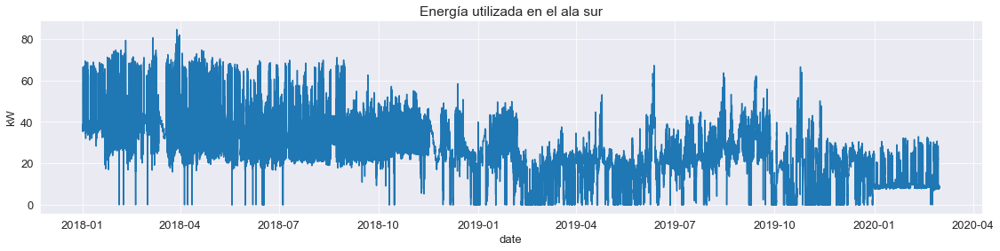

In [13]:
plt.figure(figsize=(19,4))
sns.lineplot(x =energy_use.index , y=energy_use[var])
plt.ylabel('kW')

plt.title('Energía utilizada en el ala sur')

In [14]:
# We crop until March 2020, since it's the expected normal use (covid effect)

energy_use=energy_use[energy_use.index < '2020-03-01 00:00:00']

### 1. Trend

#### Trend detection

In [15]:
#print(mk.original_test(energy_use[var], alpha=0.05))

We could use hodrick prescott filter ( more info on https://analyticsindiamag.com/a-complete-guide-to-hodrick-prescott-filter-in-time-series-analysis/), it's a mathematical tool that removes the cyclic component of time 
series. However, this tool works better for monthly, annual or quarterly data, and it does not perform well in our kind of data (each 15 min)


We can also get some knowledge about the trend component in the time series with the rolling mean.

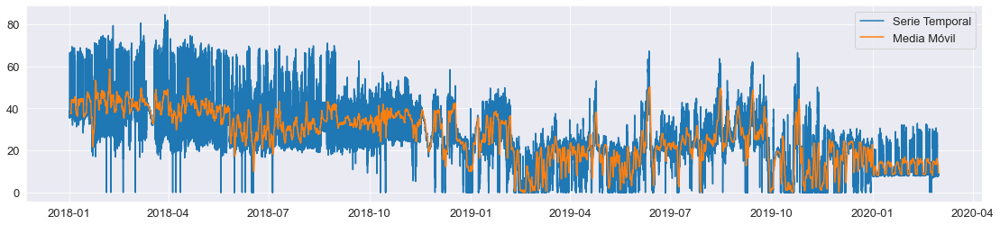

In [16]:
plt.figure(figsize=(19,4))
# calcular la media móvil de la serie temporal
rolling_mean = energy_use[['hvac_N']].rolling(window=96).mean()

#pintamos la serie temporal y la media móvil
plt.plot(energy_use['hvac_N'], label="Serie Temporal")
plt.plot(rolling_mean, label="Media Móvil")
plt.legend()
plt.show()


We can also use seasonal decompose, which decomposes into the different components (trend, stationarity, cycle and residuals), to locate and remove the trend.

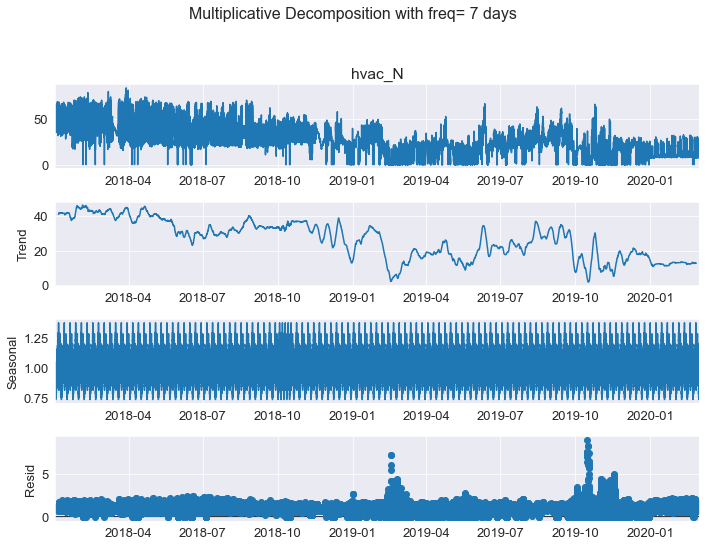

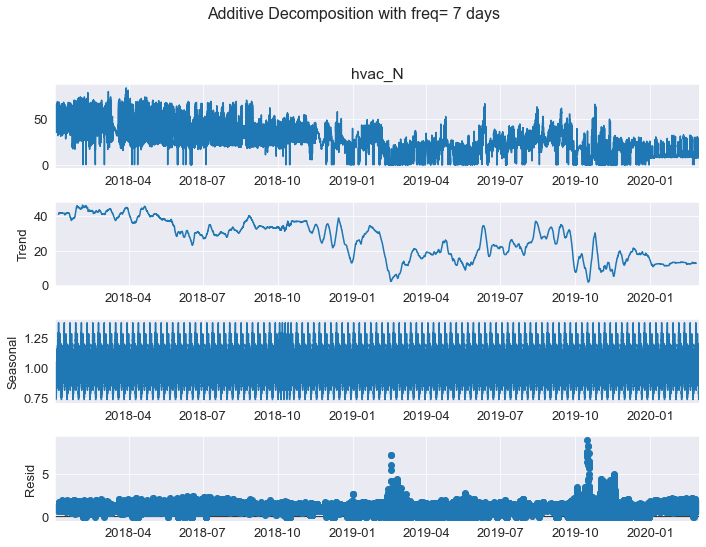

In [78]:
mostrar_descomp(energy_use, var, 96*7)

We can choose between additive and multiplicative decomposition based on the behavior of the residuals over time.

In an additive decomposition, the residuals are assumed to have a constant variance over time, so if the residuals exhibit constant variability regardless of the size of the trend, then additive decomposition is appropriate. If the residuals show an increasing or decreasing variability with the trend, then multiplicative decomposition is likely to be a better choice.

We can visualize this by examining the residual plot produced by seasonal_decompose. If the residual plot appears to have a constant variance, then additive decomposition is appropriate. If the residual plot shows an increasing or decreasing variability, then multiplicative decomposition is likely to be a better choice. 

Since we don't really see much in the last plot, we will compare only the residuals plots

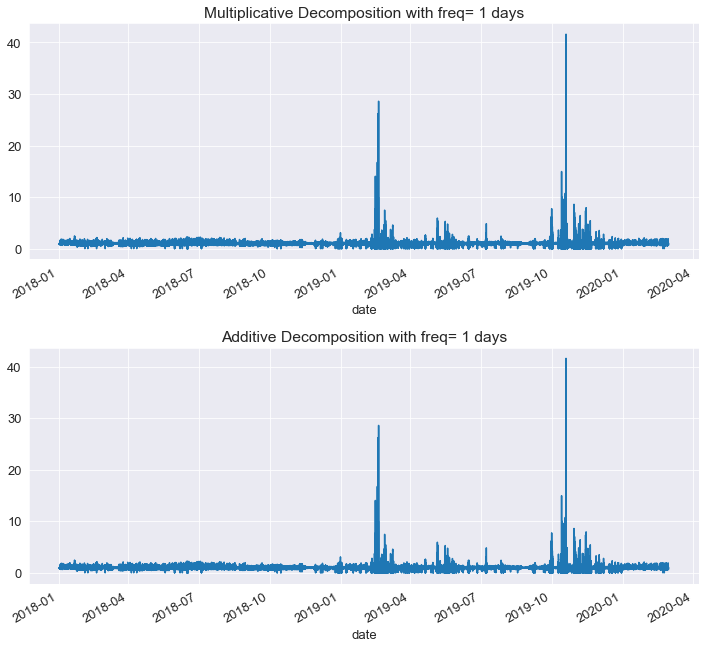

In [85]:
fig, axes = plt.subplots(nrows=2,ncols=1, figsize=(10,10) )

# Multiplicative Decomposition 
period = 96
multiplicative_decomposition = seasonal_decompose(energy_use[var], model='multiplicative', period = period)
# Additive Decomposition
additive_decomposition = seasonal_decompose(energy_use[var], model='add', period = period)
e = multiplicative_decomposition.resid
# Plot
plt.rcParams.update({'figure.figsize': (10,8)})

multiplicative_decomposition.resid.plot(ax=axes[0], title='Multiplicative Decomposition with freq= ' +str(int(period/(4*24))) + " days")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

multiplicative_decomposition.resid.plot(ax=axes[1],title='Additive Decomposition with freq= ' +str(int(period/(4*24))) + " days")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

We want to check if the residuals are correlated, so we are going to try the Ljung-Box statistical test:

In [86]:
residuals_mul =multiplicative_decomposition.resid.dropna()
residuals_add=additive_decomposition.resid.dropna()

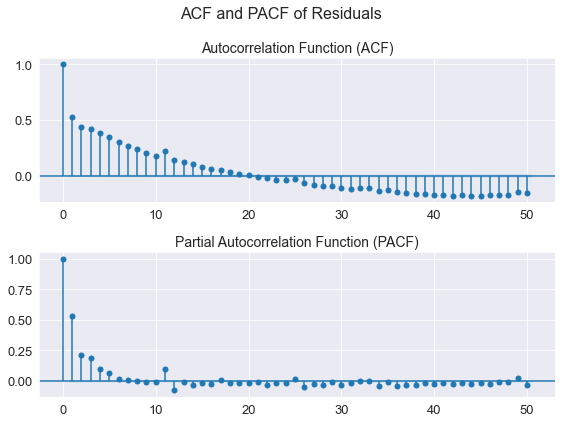

In [87]:
# Plot ACF and PACF of residuals
fig, ax = plt.subplots(2, 1, figsize=(8, 6))
plot_acf(residuals_mul, lags=50, ax=ax[0])
plot_pacf(residuals_mul, lags=50, ax=ax[1])

# Add suptitles and general title to plot
ax[0].set_title('Autocorrelation Function (ACF)', fontsize=14)
ax[1].set_title('Partial Autocorrelation Function (PACF)', fontsize=14)
fig.suptitle('ACF and PACF of Residuals', fontsize=16)

plt.tight_layout()
plt.show()

In [116]:


def residual_analysis(residuals, lags=40, test_lags = [1], alpha=0.05, title=""):
    """
    Generate various plots and tests to analyze the residuals.

    Parameters:
        residuals (array-like): Residuals to analyze
        lags (int): Number of lags to include in the autocorrelation and partial autocorrelation plots
        alpha (float): Significance level for the Ljung-Box test

    Returns:
        None
    """

    # Create common subplot for all plots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))
    fig.subplots_adjust(hspace=0.5)

    # Autocorrelation plot with confidence intervals
    sm.graphics.tsa.plot_acf(residuals, lags=lags, ax=axes[0, 0], alpha=alpha)
    axes[0, 0].set(title="Autocorrelation Plot",
                  xlabel="Lag", ylabel="Autocorrelation")

    # Partial autocorrelation plot
    sm.graphics.tsa.plot_pacf(residuals, lags=lags, ax=axes[0, 1])
    axes[0, 1].set(title="Partial Autocorrelation Plot", xlabel="Lag", ylabel="Partial Autocorrelation")

    # Q-Q plot
    sm.graphics.qqplot(residuals, line='s', ax=axes[1, 0])
    axes[1, 0].set(title="Q-Q Plot", xlabel="Theoretical Quantiles", ylabel="Sample Quantiles")

    # Histogram plot with kde line
    sns.histplot(residuals, bins=30, kde=True)
    axes[1, 1].set(title="Histogram with KDE Line", xlabel="Residuals", ylabel="Frequency")
    plt.suptitle("Residual analysis for: " + title)
    plt.show()

    # Normality test
    pvalue = normaltest(residuals)[1]
    if pvalue < alpha:
        print("The residuals do not follow a normal distribution (p-value = {:.4f}, alpha = {})".format(pvalue, alpha))
    else:
        print("The residuals follow a normal distribution (p-value = {:.4f}, alpha = {})".format(pvalue, alpha))

    # Ljung-Box test
    test_results = acorr_ljungbox(residuals, lags=test_lags)
    pvalues = test_results[1]
    if np.any(pvalues < alpha):
        print("The residuals are autocorrelated (some p-values < alpha = {:.4f})".format(alpha))
        print(pvalues)
    else:
        print("The residuals are not autocorrelated (all p-values >= alpha = {:.4f})".format(alpha))


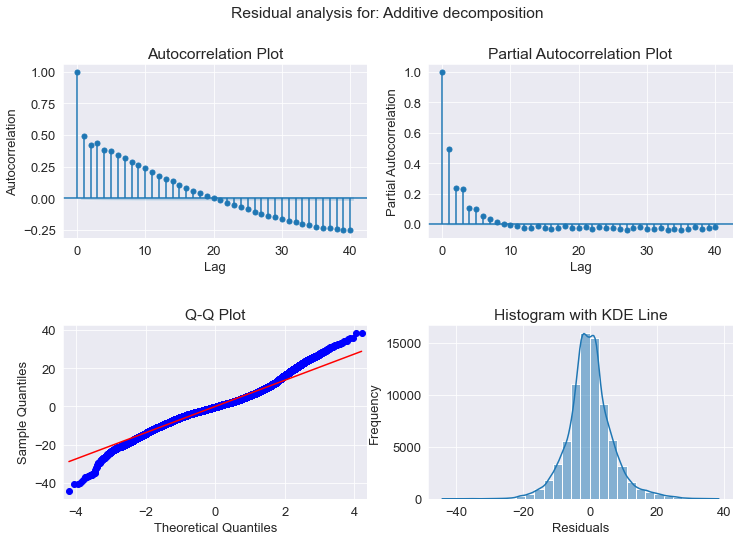

The residuals do not follow a normal distribution (p-value = 0.0000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500)
[0. 0.]


In [119]:
residual_analysis(residuals_add, test_lags=[1,4], title="Additive decomposition")

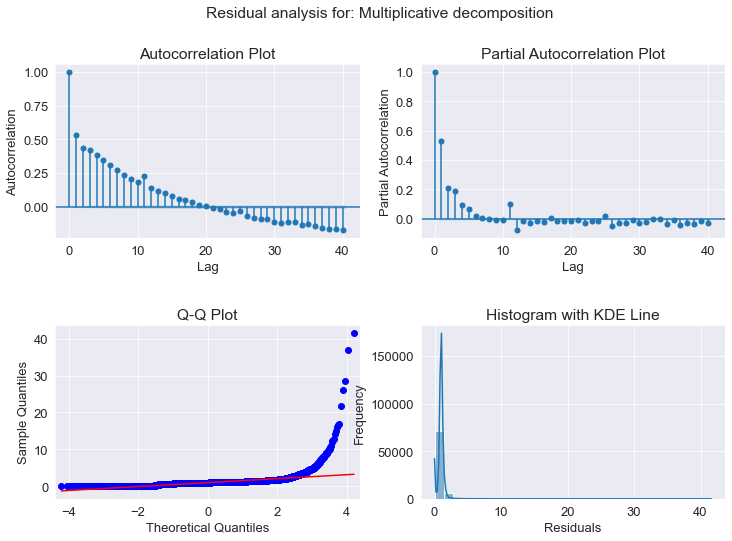

The residuals do not follow a normal distribution (p-value = 0.0000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500)
[0.]


In [120]:
residual_analysis(residuals_mul, title="Multiplicative decomposition")

TODO: check if the decomposition is white noise?

Due to this situation, we will try another algorithm to decompose, the STL algorithm (https://otexts.com/fpp2/stl.html):

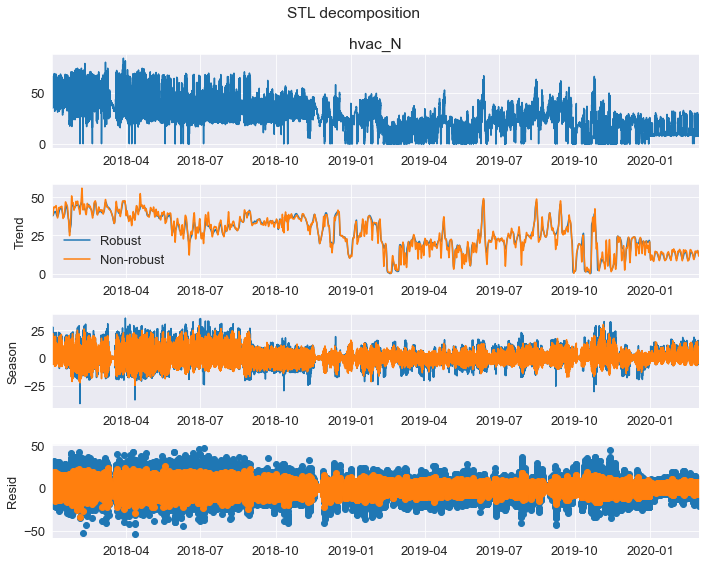

In [108]:
from statsmodels.tsa.seasonal import STL
def add_stl_plot(fig, res, legend):
    """Add 3 plots from a second STL fit"""
    axs = fig.get_axes()
    comps = ["trend", "seasonal", "resid"]
    for ax, comp in zip(axs[1:], comps):
        series = getattr(res, comp)
        if comp == "resid":
            ax.plot(series, marker="o", linestyle="none")
        else:
            ax.plot(series)
            if comp == "trend":
                ax.legend(legend, frameon=False)

period = 96
stl = STL(energy_use[var], seasonal =5, period=period, robust=True)
res_robust = stl.fit()
fig = res_robust.plot()
res_non_robust = STL(energy_use[var], seasonal =5, period=period, robust=False).fit()

residuals_stl_n = res_non_robust.resid.dropna()
residuals_stl_r = res_robust.resid.dropna()
add_stl_plot(fig, res_non_robust, ["Robust", "Non-robust"])
fig.suptitle("STL decomposition")
plt.tight_layout()

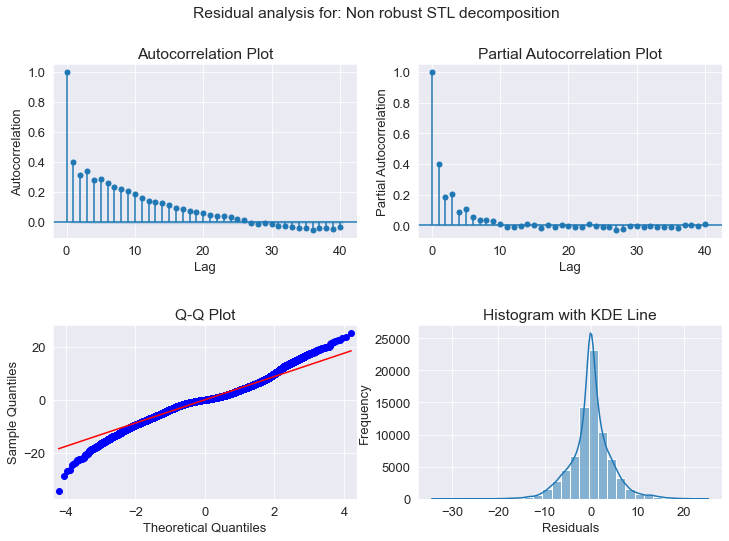

The residuals do not follow a normal distribution (p-value = 0.0000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [114]:
residual_analysis(residuals_stl_n, title ="Non robust STL decomposition")

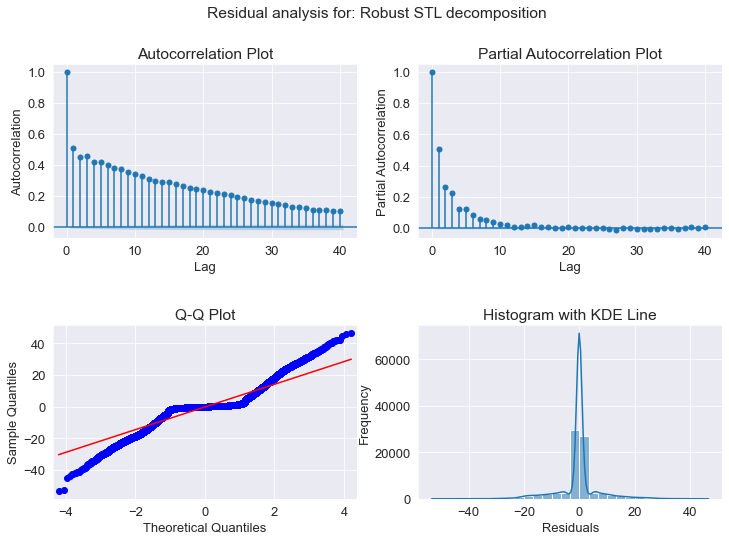

The residuals do not follow a normal distribution (p-value = 0.0000, alpha = 0.05)
The residuals are autocorrelated (some p-values < alpha = 0.0500)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [115]:
residual_analysis(residuals_stl_r, title ="Robust STL decomposition")



#### Detrending

Even if we don't really have a clear trend, we want to check these tools and see if there are some subtrends that we didn't catch in our first analysis.(Mathematical explanation in https://link.springer.com/content/pdf/10.1007/978-1-4419-0320-4.pdf)


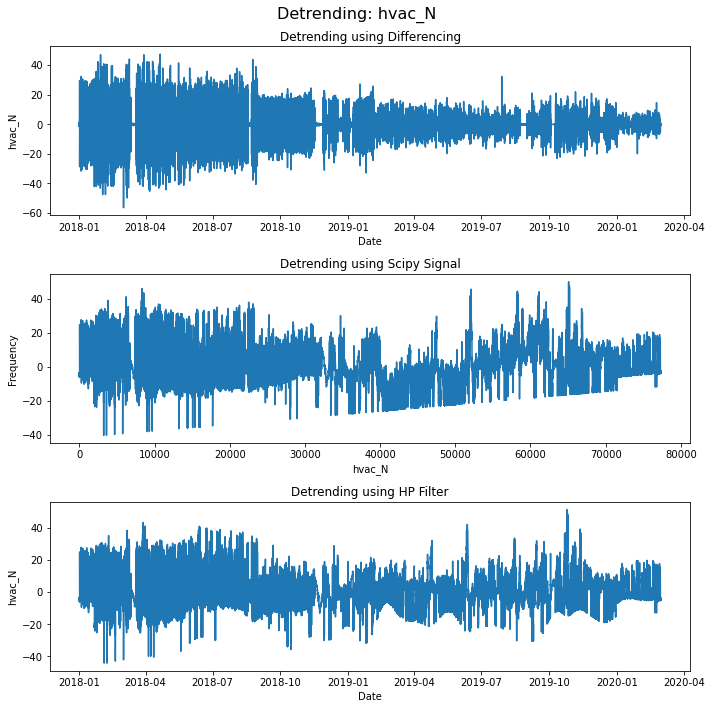

In [25]:
plot_detrends(energy_use, var)

Things to take into account:
- Differencing is the most common way of detrending, since it makes the time series stationary
- Scipy Signal uses the least squares fit as a trend component, and then removes it from the original time series. This has limitations if the trend is non linear
- HP Filter is not very used in time series with such small periods (lambda parameter is too big)


### 2. Seasonality 

We will study seasonality with Multiple Box Plots and Autocorrelation Plots:

#### Multiple Box Plots

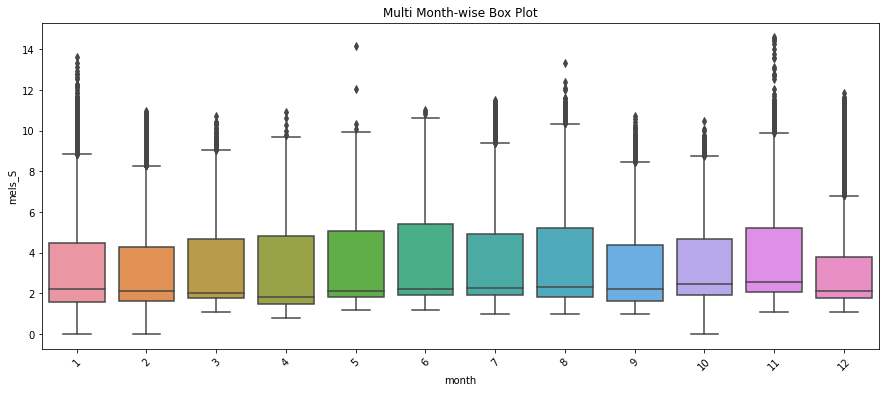

In [19]:
energy_use['month'] = energy_use.index.month
plt.figure(figsize=(15,6))
sns.boxplot(x='month', y=var, data=energy_use)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

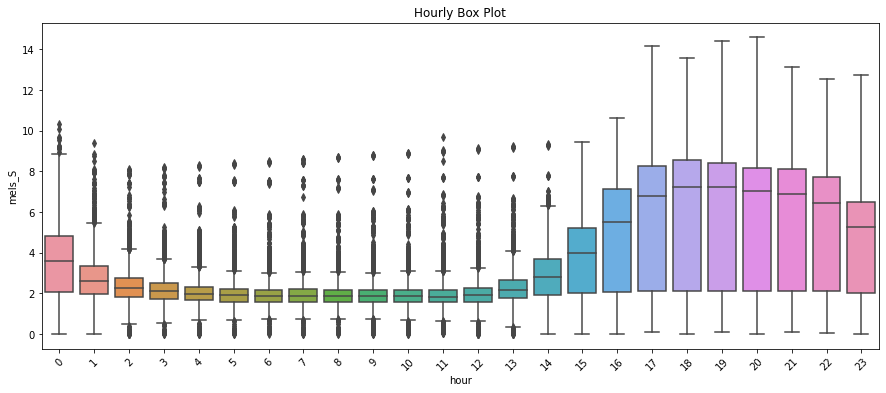

In [20]:
energy_use['hour'] = energy_use.index.hour
plt.figure(figsize=(15,6))
sns.boxplot(x='hour', y=var, data=energy_use)
plt.title("Hourly Box Plot")
plt.xticks(rotation=45)
plt.show()

We can see some seasonal (hourly) pattern, however, the box plots are very wide so we will try to detrend it using differencing to reduce it 



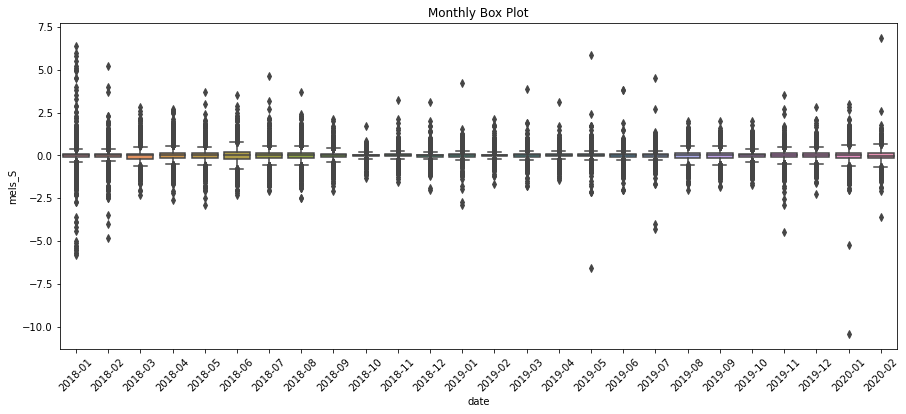

In [30]:
diff = energy_use[var].diff()
months = diff.index.to_period("M")
diff.columns = [var, 'months']
plt.figure(figsize=(15,6))
sns.boxplot(x=months, y=diff)
plt.title("Monthly Box Plot")
plt.xticks(rotation=45)
plt.show()

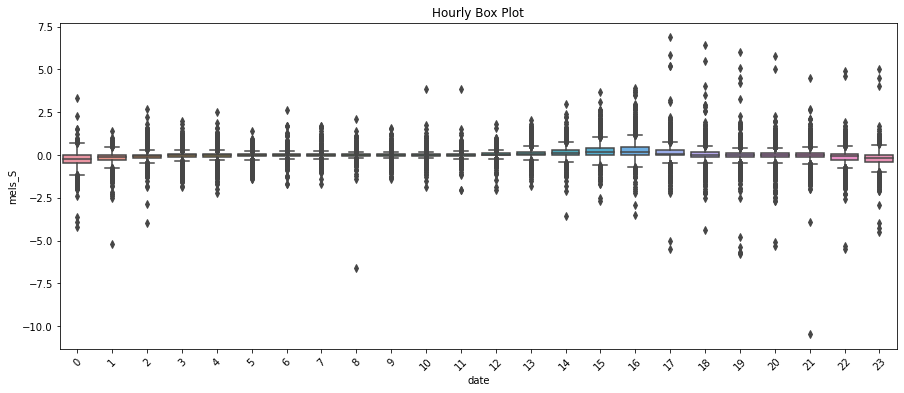

In [31]:
diff = energy_use[var].diff()
hours = diff.index.hour
diff.columns = [var, 'hour']
plt.figure(figsize=(15,6))
sns.boxplot(x=hours, y=diff)
plt.title("Hourly Box Plot")
plt.xticks(rotation=45)
plt.show()

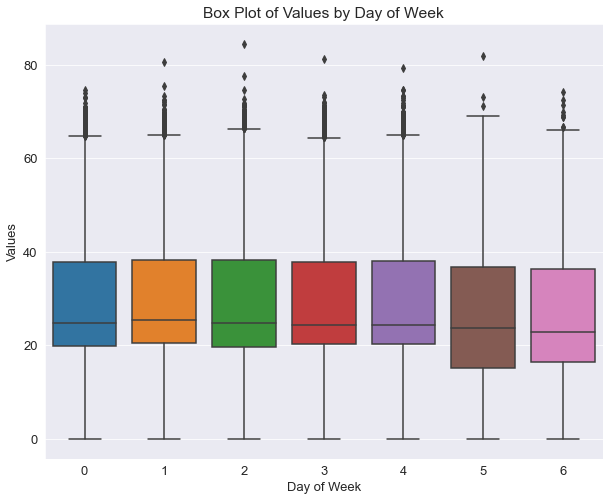

In [123]:
#Day of week
energy_use['day_of_week'] = energy_use.index.dayofweek

# create a box plot of some random values by day of week
sns.boxplot(x='day_of_week', y=var, data=energy_use)
plt.title('Box Plot of Values by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Values')
plt.show()


We can see that there is no seasonality pattern in the day of the week or month since the distributions are consistent. The only seasonality that we can assume is daily, which is the one corresponding to the hourly box plot, where we can clearly see a pattern. Ideally we would want to have more of a drastic difference in the range of the box in each hour, as we commented earlier, however, it can give us a good hint about the seasonality.

It's important to note that while a pattern in a box plot may suggest seasonality, further analysis is needed to confirm this and determine the appropriate methods for modeling and forecasting the data.

#### Autocorrelation and partial autocorrelation plots

Mathematical explanation of autocorrelation plots: https://www.itl.nist.gov/div898/handbook/eda/section3/autocopl.htm



<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

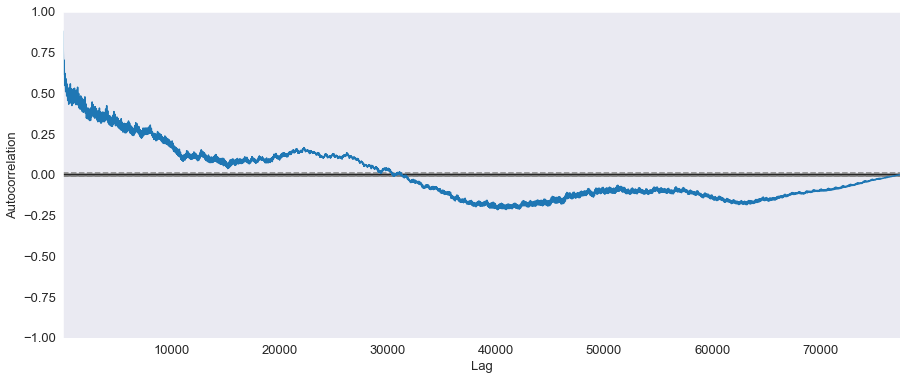

In [124]:
plt.figure(figsize=(15,6))
autocorrelation_plot(energy_use[var].tolist())

(0.0, 500.0)

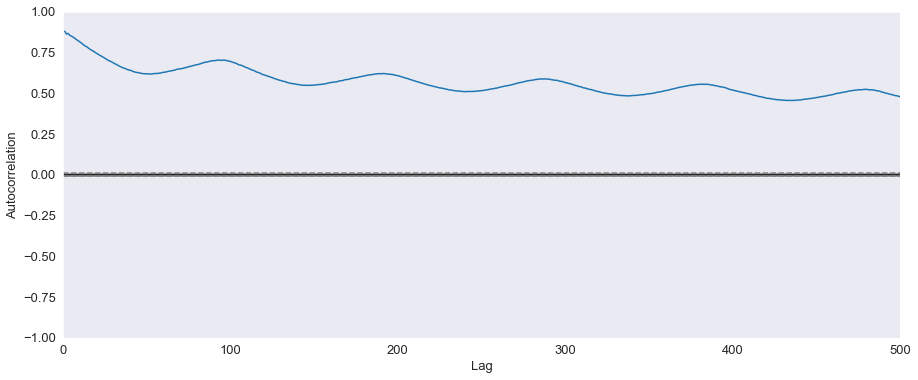

In [125]:
# We limit the plot
plt.figure(figsize=(15,6))

autocorrelation_plot(energy_use[var].tolist()).set_xlim([0,500])

We can see that the autocorrelation plot doesn't get close to 0 until a very high lag. This means that the current value of the time series is influenced by its past values for a long period of time. In other words, there is a strong autocorrelation between the current value and past values of the time series even after many lags.

We are going to check the first 50 lags to see if we can extract some more information




<Figure size 720x432 with 0 Axes>

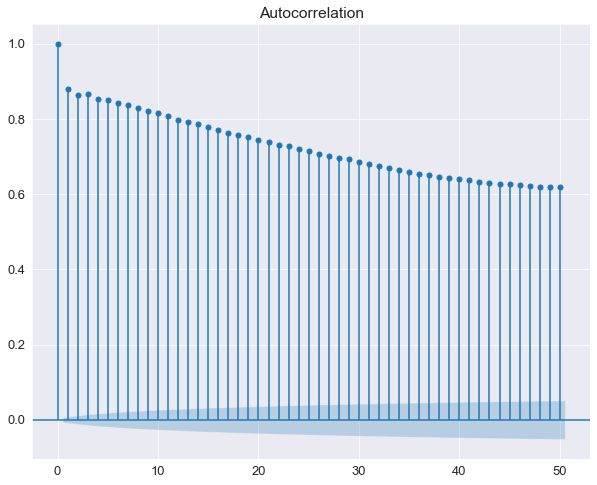

In [131]:
plt.figure(figsize=(10,6))
fig=plot_acf(energy_use[var], lags=50)
plt.show()

#### Partial Autocorrelation Plots

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

<Figure size 72x432 with 0 Axes>

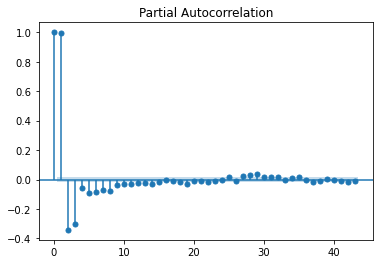

In [24]:
plt.figure(figsize=(1,6))

plot_pacf(energy_use[var],method='ols' ) #Probar varios métodos
plt.show()

[Text(0.5, 1.0, 'Partial Autocorrelation Plot')]

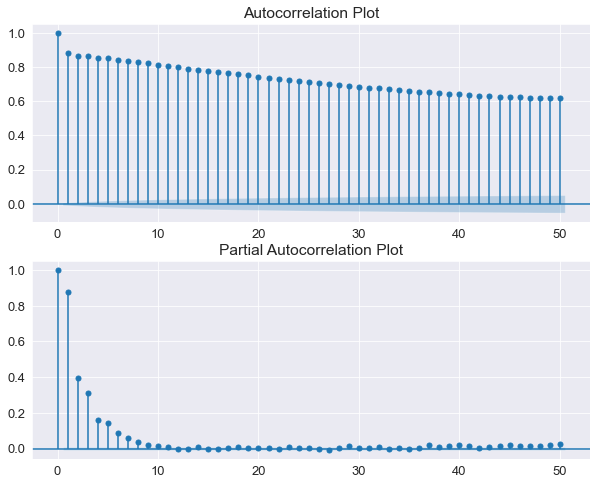

In [128]:
#Complete plot

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Plot the autocorrelation function (ACF) with 50 lags
plot_acf(energy_use[var], lags=50, ax=ax1)
ax1.set(title='Autocorrelation Plot')

# Plot the partial autocorrelation function (PACF) with 50 lags
plot_pacf(energy_use[var], lags=50, ax=ax2)
ax2.set(title='Partial Autocorrelation Plot')

We have two observations to make:
- As we saw earlier, the autocorrelation plot is very high up until a very high lag, this means that there are some significant correlations even at higher lags.

- The partial autocorrelation plot is showing that there are significant correlations between the current value of the time series and its past values up to a certain lag, but after that, the correlations drop off quickly. 

The partial autocorrelation plot may show the correlations between the current value and its past values within a given season or trend, while the autocorrelation plot is capturing the persistence of the overall pattern across multiple seasons or trends.

#### Differenced time series
We are going to check the differenced time series:

[Text(0.5, 1.0, 'Partial Autocorrelation Plot')]

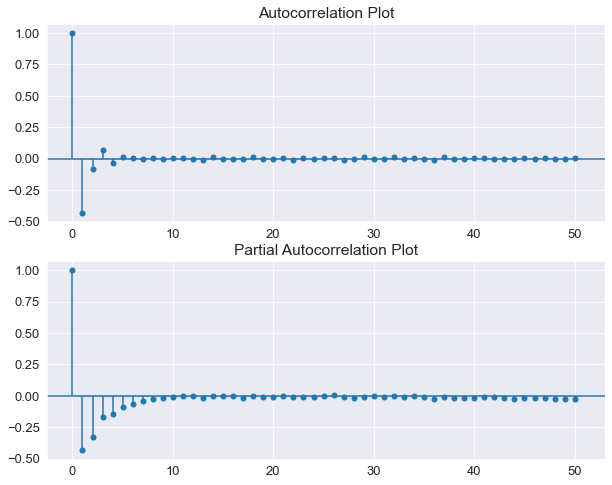

In [134]:
#Complete plot

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Plot the autocorrelation function (ACF) with 50 lags
plot_acf(energy_use[var].diff().dropna(), lags=50, ax=ax1)
ax1.set(title='Autocorrelation Plot')

# Plot the partial autocorrelation function (PACF) with 50 lags
plot_pacf(energy_use[var].diff().dropna(), lags=50, ax=ax2)
ax2.set(title='Partial Autocorrelation Plot')

In this case, the autocorrelation and partial autocorrelation plots of the differenced time series both drop below 0 in the second lag, indicating that there is a strong negative correlation between the observations in the first and second lags, which could suggest that there is a seasonality pattern with a period of 2. 

The fact that the autocorrelation plot had a very high autocorrelation until a very high lag without differencing, and the partial autocorrelation dropped to 0 very quickly, suggests that the time series had a strong trend component that was removed after differencing. This could lead us to belive that the original time series was non-stationary and required differencing to make it stationary.

### 3. Seasonal decomposition

We can use seasonal decomposition to remove seasonality from data and check the data only with the trend, cyclic, and irregular variations.

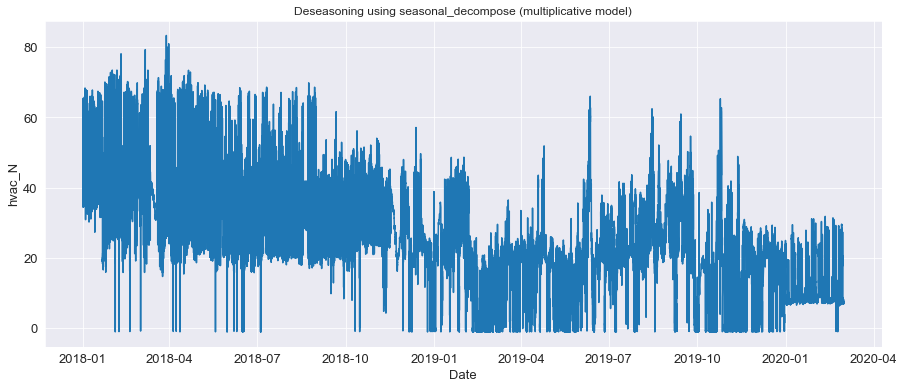

In [135]:
#FREQ OF DAY
plot_seasonal_decompose(energy_use, var, 'multiplicative', 96)

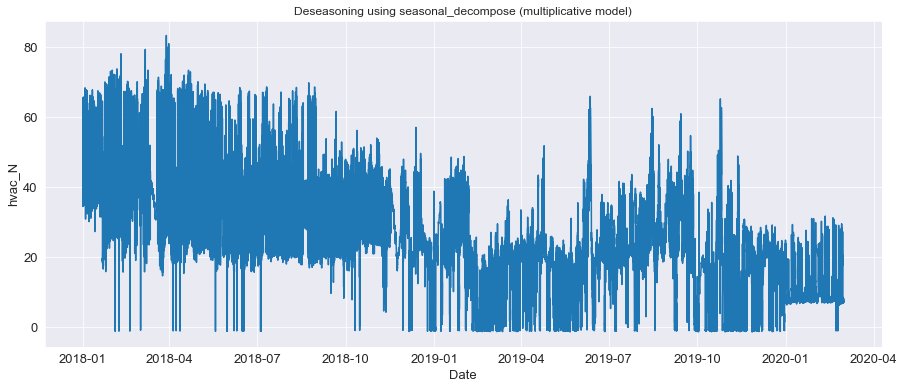

In [136]:
#FREQ OF DAY
plot_seasonal_decompose(energy_use, var, 'multiplicative', 672)

In [5]:
def plot_seasonal(df, var, model, period):
    result_mul = seasonal_decompose(df[var], model=model, period = period)
    res = result_mul.seasonal

    fig = go.Figure()
    result_mul = seasonal_decompose(energy_use[var], model=model, period = period)
    res = result_mul.seasonal
    fig.add_trace(
        go.Scatter(x=list(df.index), y=list(res)))

    # Set title
    fig.update_layout(
        title_text='seasonal_decompose (' +model+ ' model) with freq= ' +str(int(period/(4*24))) + " days", 
        title_font_size=20
    )

    # Add range slider
    fig.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1m",
                        step="month",
                        stepmode="backward"),
                    dict(count=6,
                        label="6m",
                        step="month",
                        stepmode="backward"),
                    dict(count=1,
                        label="YTD",
                        step="year",
                        stepmode="todate"),
                    dict(count=1,
                        label="1d",
                        step="day",
                        stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig.show()


In [139]:
plot_seasonal(energy_use, var, 'add', 96)

### 4. Cyclical Components
Cyclical components are fluctuations around a long trend observed every few units of time. We will use one more time the HP Filter to detect them:

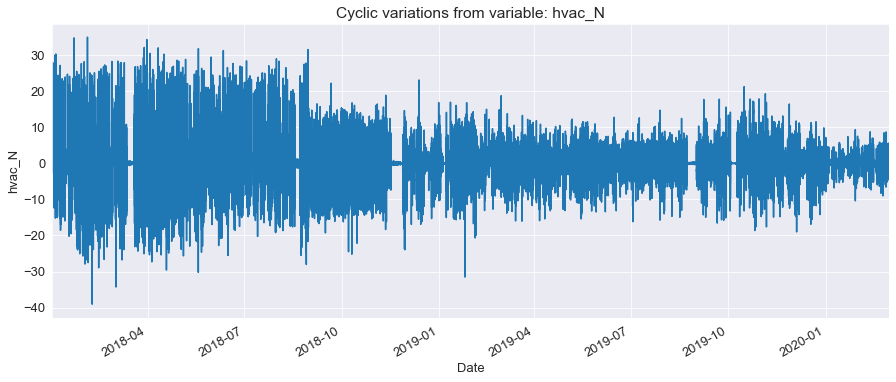

In [140]:

plot_hpfilter2(energy_use, var, 'Cyclic variations from variable: ' + var)

### 6. Rolling Statistics plot

We are going to plot the rolling mean and standard deviation of the time series, with a window of a week (672 rows)

In [142]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)




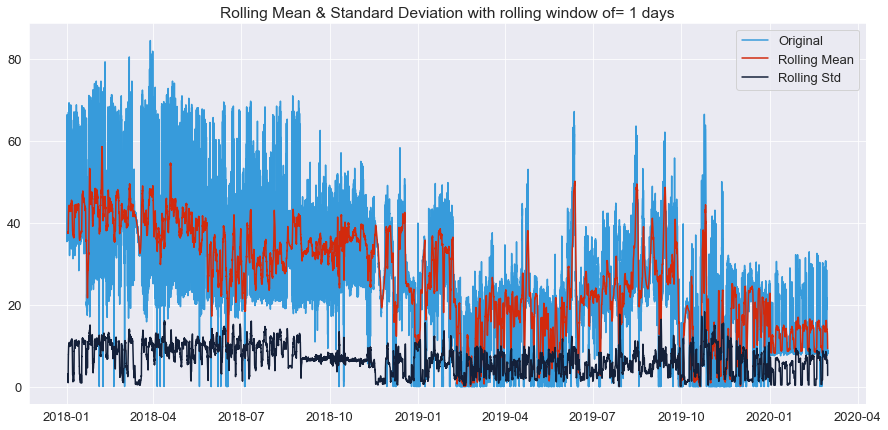

In [144]:
plot_rolling_stats(energy_use[var], 96)

Next, we will repeat the exact same plot but this time with the differenced time series, to check how the statistical properties change with time:


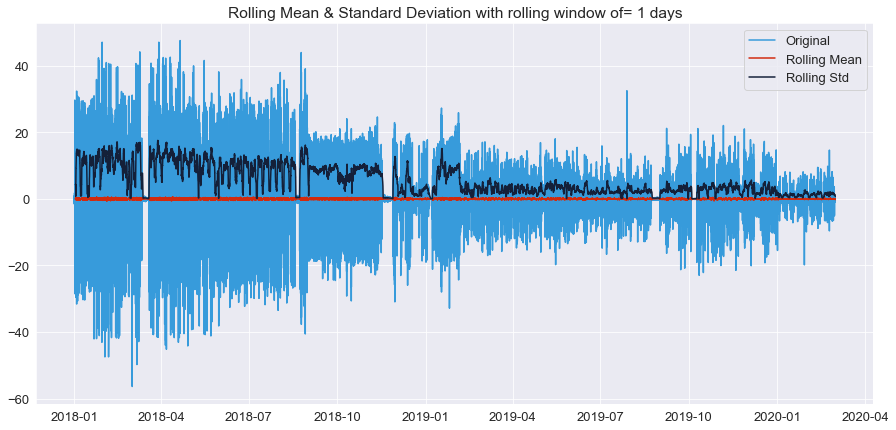

In [145]:
plot_rolling_stats(energy_use[var].diff().dropna(), 96)

### 7. Dickey Fuller Test for stationarity

Finally, we will run the dickey fuller (https://atsa-es.github.io/atsa-labs/sec-boxjenkins-aug-dickey-fuller.html) test on this variable

In [146]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(energy_use[var], autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  

ADF Statistic: -9.425294575026076
n_lags: 5.366921858102504e-16
p-value: 5.366921858102504e-16
Critial Values:
   1%, -3.4304346035652356
Critial Values:
   5%, -2.8615773933293207
Critial Values:
   10%, -2.5667899031818053


Since the p-value is lower than 0.5, we can reject the null hypothesis "the time series is non stationary", this means that we can assume that the time series is stationary.



In [147]:
result = adfuller(energy_use[var].diff().dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  


ADF Statistic: -56.52106299214712
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.430434604659826
Critial Values:
   5%, -2.861577393813104
Critial Values:
   10%, -2.566789903439308


The result is the same, but in the plot we can see that the stationarity of the time series is much more evident in the differenced one.

## Grouped by hour time series





In [148]:
# Importamos csv
energy_use['hour'] = energy_use.index.to_period("h")
energy_grouped = energy_use.groupby('hour').mean()
energy_grouped.index = energy_grouped.index.to_timestamp()

The first variable we will study is 'mels_S' (miscellaneous energy use in the south wing of the building).

In [151]:
var = 'hvac_N'

Text(0.5, 1.0, 'HVAC in North Wing')

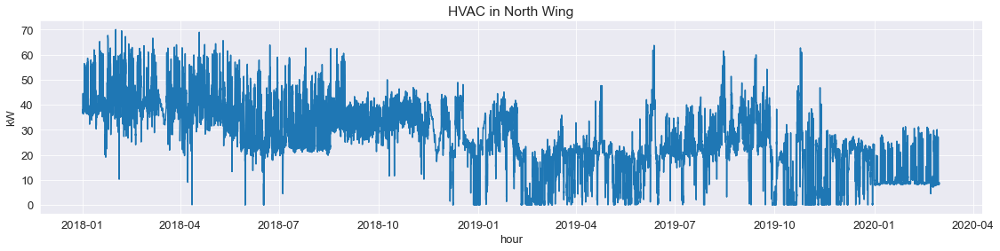

In [153]:
plt.figure(figsize=(19,4))
sns.lineplot(x =energy_grouped.index , y=energy_grouped[var])
plt.ylabel('kW')

plt.title('HVAC in North Wing')

### 1. Trend detection

We will run two tests for trend detection:
- **Mann–Kendall trend test**: https://www.frontiersin.org/articles/10.3389/feart.2020.00014/full
- **Hodrick–Prescott filter**: https://eprints.whiterose.ac.uk/97954/1/HP_ACM.pdf

In [22]:
def plot_hpfilter(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_trend.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.title(title)

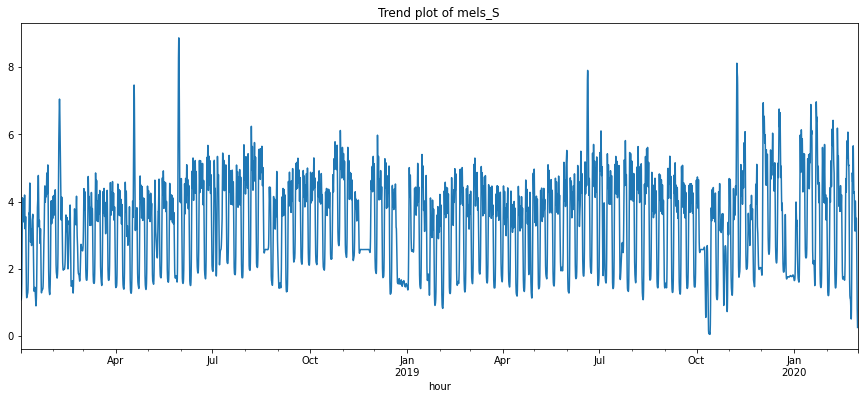

In [26]:
plot_hpfilter(energy_grouped, var, 'Trend plot of mels_S')

We don't really see a very clear trend, however, there is some seasonal pattern in the years 2018 and 2019. The last year (2020) is completely different, which makes sense since the use of the building decreased due to the pandemic.

#### Detrending

Even if we don't really have a clear trend, we want to check these tools and see if there are some subtrends that we didn't catch in our first analysis.(Mathematical explanation in https://link.springer.com/content/pdf/10.1007/978-1-4419-0320-4.pdf)


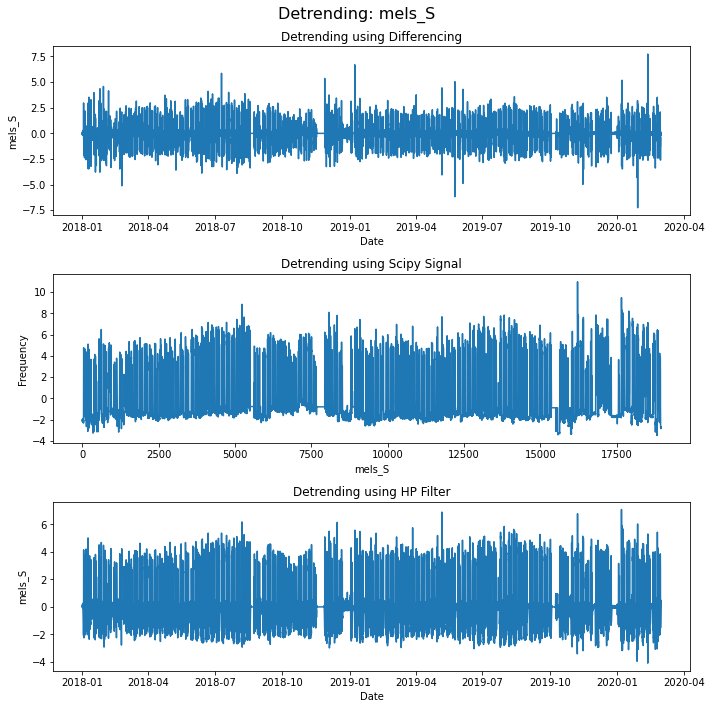

In [27]:
plot_detrends(energy_grouped, var)

### 2. Seasonality 

We will study seasonality with Multiple Box Plots and Autocorrelation Plots:

#### Multiple Box Plots

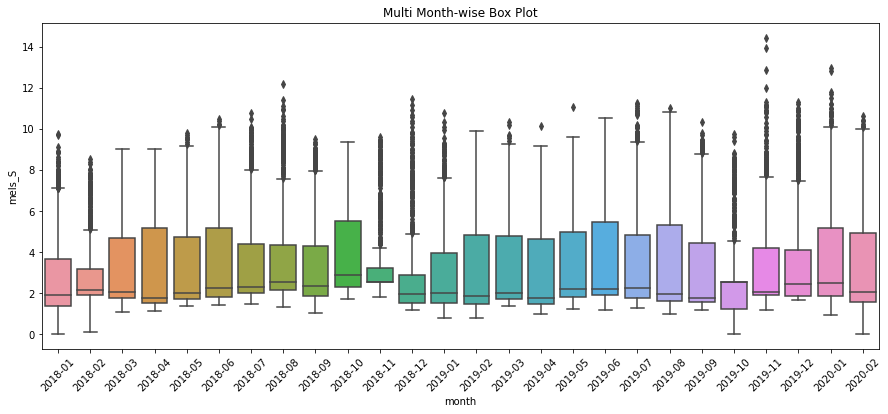

In [29]:
energy_grouped['month'] = energy_grouped.index.to_period("M")
plt.figure(figsize=(15,6))
sns.boxplot(x='month', y=var, data=energy_grouped)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

We don't see a seasonal pattern in the box plot, we will try to plot it again with detrended time series, using differencing:



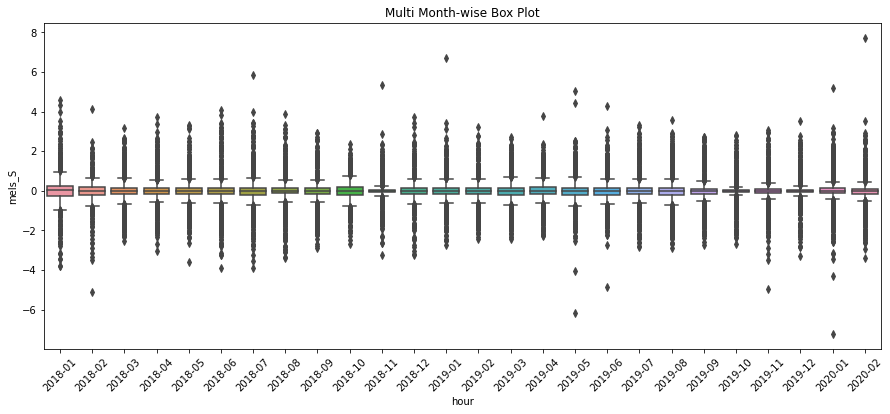

In [30]:
diff = energy_grouped[var].diff()
months = diff.index.to_period("M")
diff.columns = [var, 'month']
plt.figure(figsize=(15,6))
sns.boxplot(x=months, y=diff)
plt.title("Multi Month-wise Box Plot")
plt.xticks(rotation=45)
plt.show()

Detrending didn't show any seasonality either.

#### Autocorrelation and partial autocorrelation plots

Mathematical explanation of autocorrelation plots: https://www.itl.nist.gov/div898/handbook/eda/section3/autocopl.htm



<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

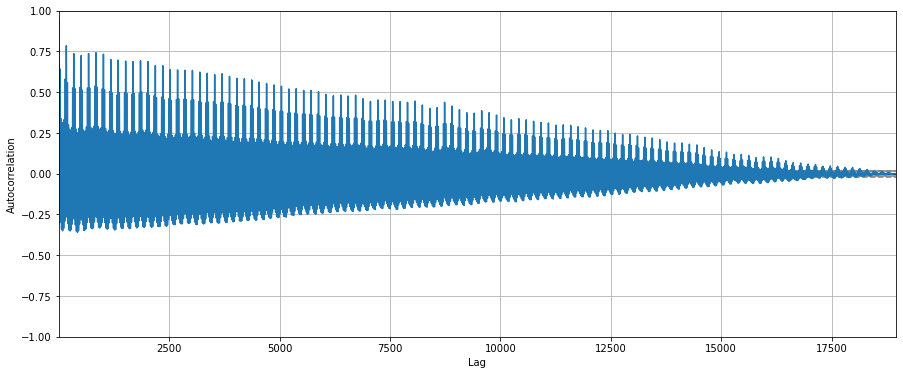

In [31]:
plt.figure(figsize=(15,6))
autocorrelation_plot(energy_grouped[var].tolist())

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

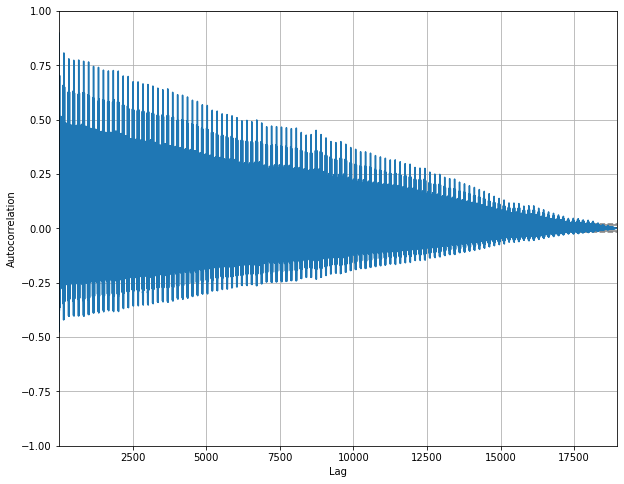

In [69]:
diff = energy_grouped[var]-energy_grouped[var].shift(4)
autocorrelation_plot(diff.dropna().tolist())

(0.0, 7000.0)

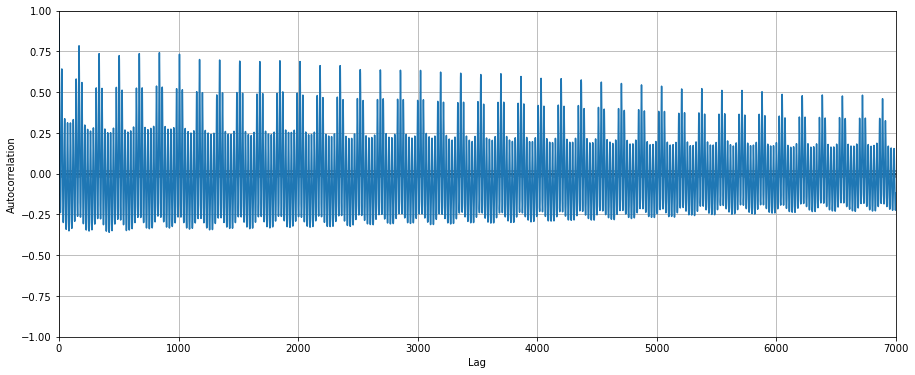

In [32]:
plt.figure(figsize=(15,6))

autocorrelation_plot(energy_grouped[var].tolist()).set_xlim([0,7000])

We can see that the initial autocorrelation plot didn't really show any seasonality, but once we "zoom in" (we change the lag in the x axis), we can clearly see some pattern. One reason for this could be that when we reduce the lag we are checking the pattern day by day, instead of a generic pattern, so clearly the correlation between measures at the same time of different days is going to be higher than the one between random measures in different days of the three years.


We check another way of plotting the same thing:




<Figure size 1080x432 with 0 Axes>

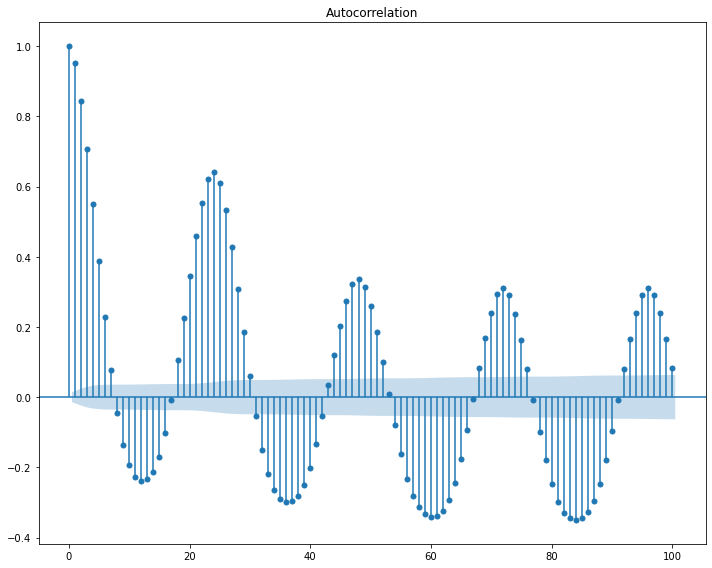

In [71]:
plt.figure(figsize=(15,6))
fig=plot_acf(energy_grouped[var],lags=100)

fig.tight_layout()
plt.show()

<Figure size 1080x432 with 0 Axes>

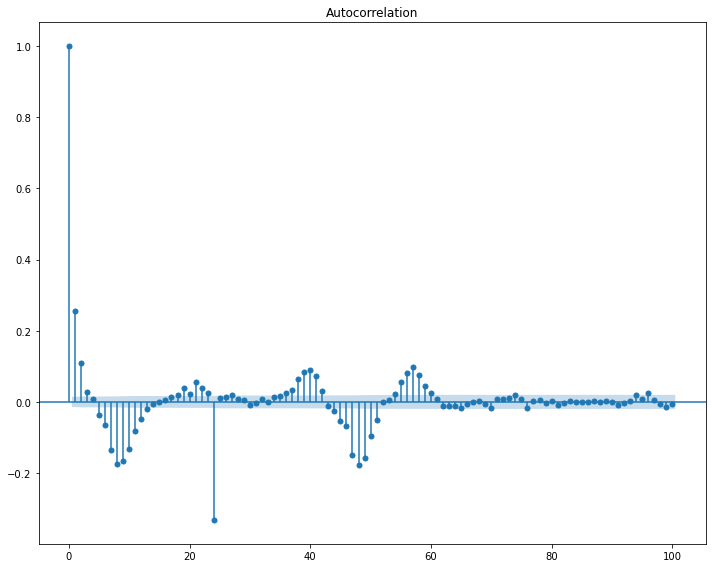

In [79]:
plt.figure(figsize=(15,6))
diff = energy_grouped[var]-energy_grouped[var].shift(1)
diff = diff-diff.shift(24)
fig=plot_acf(diff.dropna(),lags=100)

fig.tight_layout()
plt.show()

<Figure size 1080x432 with 0 Axes>

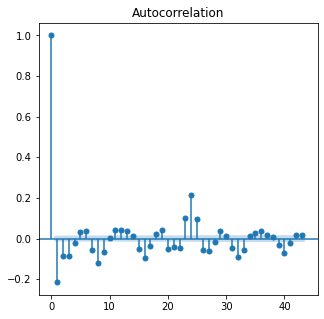

In [34]:
#We also plot the autocorrelation plot of the differenced time series:

fig =plt.figure(figsize=(15,6))
fig=plot_acf(energy_grouped[var].diff().diff().dropna())
fig.set_figheight(5)
fig.set_figwidth(5)
plt.show()

#### Partial Autocorrelation Plots

A partial autocorrelation is a summary of the relationship between an observation in a time series with observations at prior time steps with the relationships of intervening observations removed.

<Figure size 72x432 with 0 Axes>

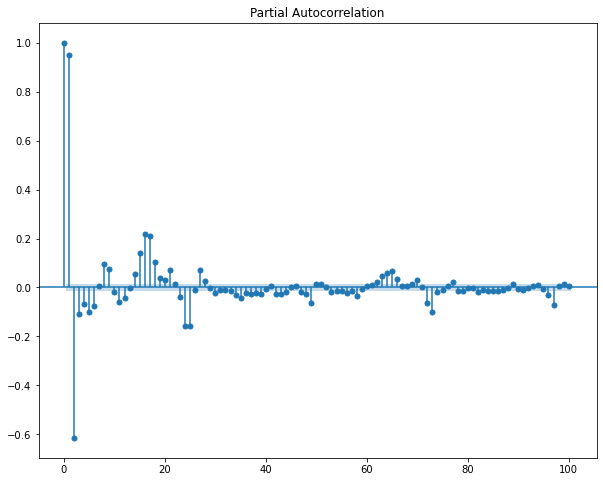

In [80]:
plt.figure(figsize=(1,6))

plot_pacf(energy_grouped[var],method='ols', lags=100 ) #Probar varios métodos
plt.show()

### 3. Seasonal decomposition

We can use seasonal decomposition to remove seasonality from data and check the data only with the trend, cyclic, and irregular variations.

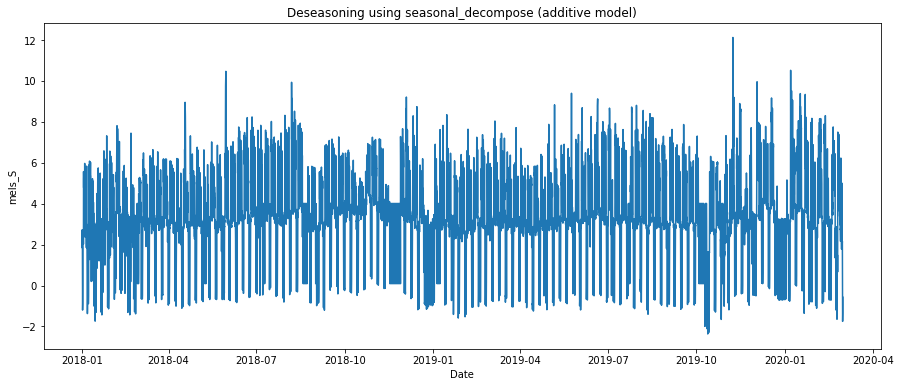

In [39]:
#FREQ OF DAY
plot_seasonal_decompose(energy_grouped, var, 'additive', 24)

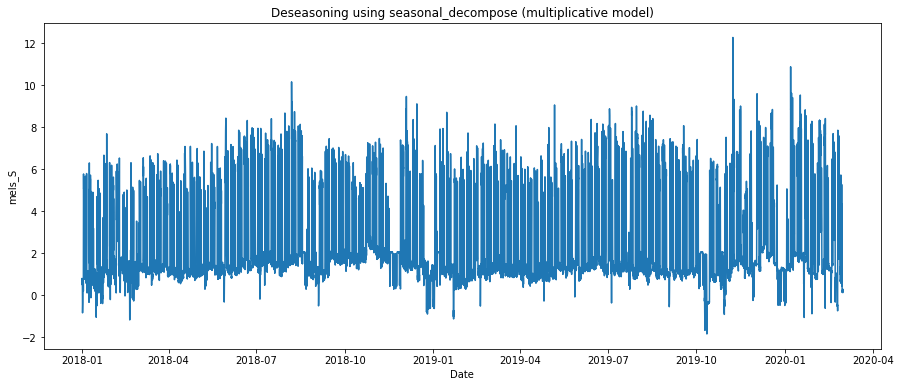

In [41]:
#FREQ OF DAY
plot_seasonal_decompose(energy_grouped, var, 'multiplicative', 168)

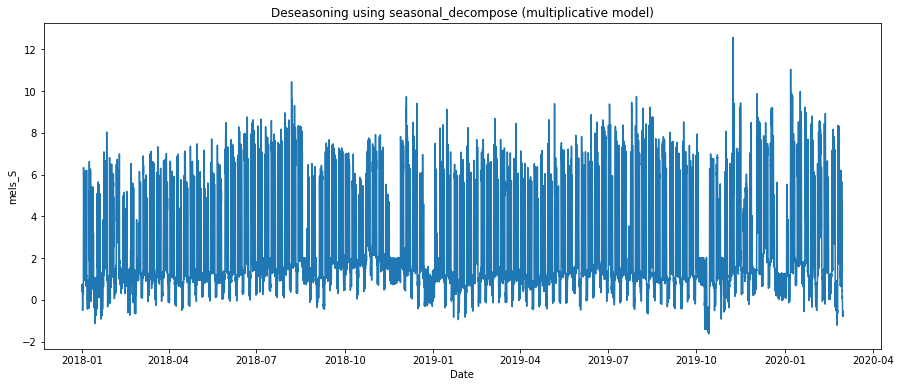

In [42]:
plot_seasonal_decompose(energy_grouped, var, 'multiplicative', 720)

In [44]:
plot_seasonal(energy_grouped, var, 'add', 24)

In [45]:
plot_seasonal(energy_grouped, var, 'add', 672)

In [46]:
plot_seasonal(energy_grouped, var, 'multiplicative', 2880)

### 4. Cyclical Components
Cyclical components are fluctuations around a long trend observed every few units of time. We will use one more time the HP Filter to detect them:

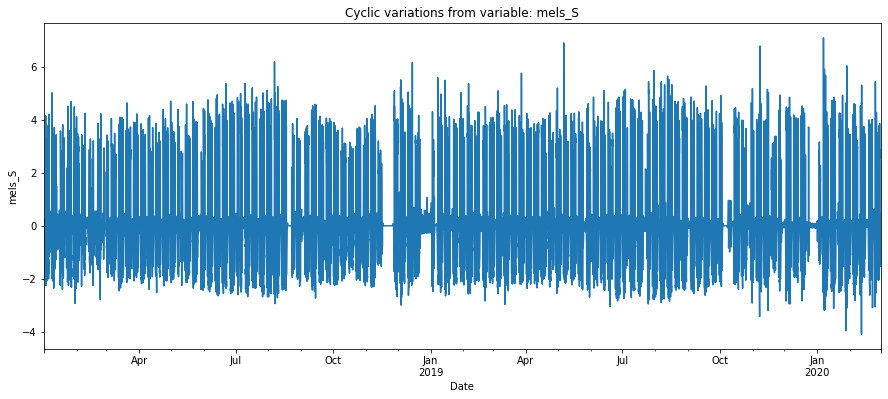

In [47]:
def plot_hpfilter2(df, var, title):
    eu_cycle,eu_trend = hpfilter(df[var], lamb=1600) 
    eu_cycle.plot(figsize=(15,6)).autoscale(axis='x',tight=True)
    plt.xlabel('Date')
    plt.ylabel(var)  
    plt.title(title)
plot_hpfilter2(energy_grouped, var, 'Cyclic variations from variable: ' + var)

### 5. Decomposition of time series



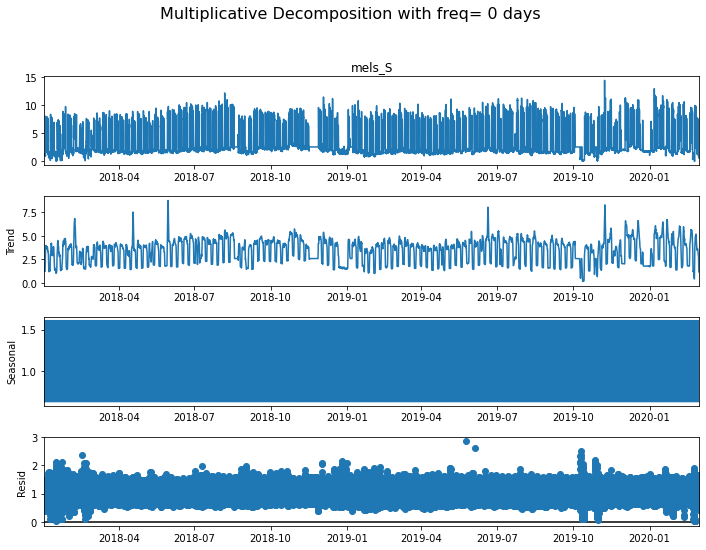

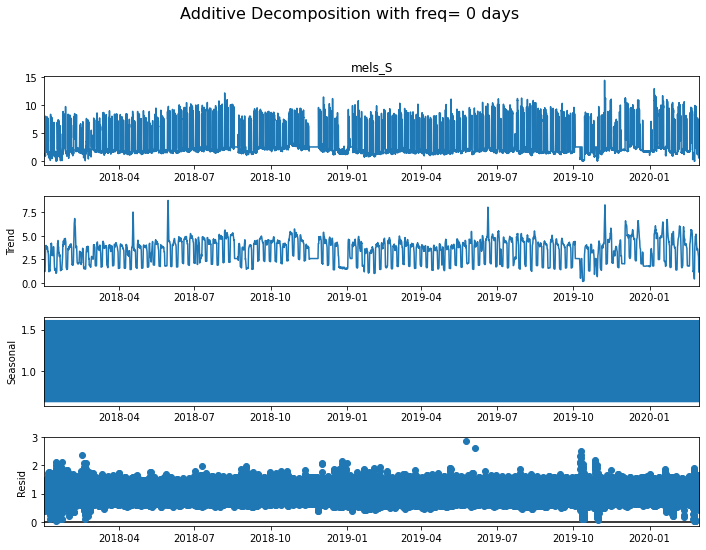

In [49]:
#Hourly period (means that the cycle of seasonality is an hour)
mostrar_descomp(energy_grouped, var, 24)

### 6. Rolling Statistics plot

We are going to plot the rolling mean and standard deviation of the time series, with a window of a week (672 rows)

In [ ]:
def plot_rolling_stats(series, period):

    #Determine rolling statistics
    rolling_avg = series.rolling(window=period).mean() 
    rolling_std = series.rolling(window=period).std() 

    #Plot rolling statistics
    plt.figure(figsize=(15,7))
    plt.plot(series, color='#379BDB', label='Original')
    plt.plot(rolling_avg, color='#D22A0D', label='Rolling Mean')
    plt.plot(rolling_std, color='#142039', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation with rolling window of= ' +str(int(period/(4*24))) + " days")
    plt.show(block=False)




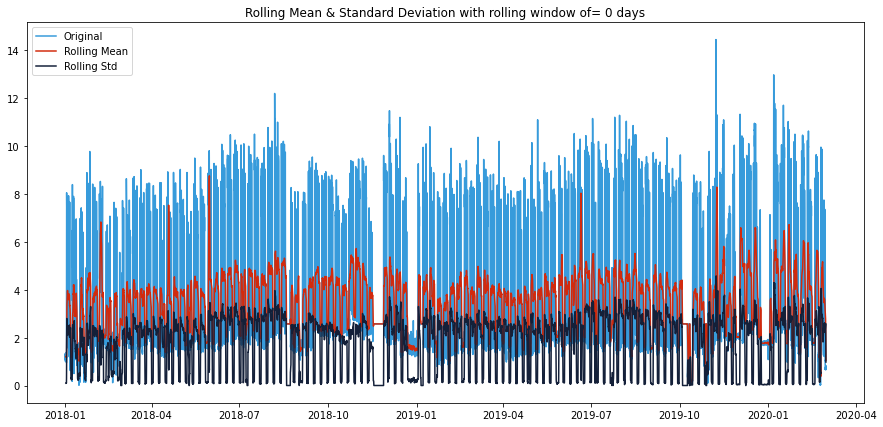

In [50]:
plot_rolling_stats(energy_grouped[var], 24)

### 7. Dickey Fuller Test for stationarity

Finally, we will run the dickey fuller (https://atsa-es.github.io/atsa-labs/sec-boxjenkins-aug-dickey-fuller.html) test on this variable

In [51]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(energy_grouped[var], autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  

ADF Statistic: -19.224326027324143
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.4306957672569833
Critial Values:
   5%, -2.861692816492489
Critial Values:
   10%, -2.5668513401272257


Since the p-value is lower than 0.5, we can reject the null hypothesis: the time series is non stationary, this means that the time series is stationary.

We will now repeat the test with the differenced time series:

In [52]:
result = adfuller(energy_grouped[var].diff().dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')  


ADF Statistic: -24.689211163637967
n_lags: 0.0
p-value: 0.0
Critial Values:
   1%, -3.430695803825926
Critial Values:
   5%, -2.861692832653684
Critial Values:
   10%, -2.5668513487295606
